# Setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# read files from google drive
import os
GOOGLE_DRIVE_PATH_AFTER_MYDRIVE = 'Colab Notebooks/NTU_MLDS_Spring2018/HW3'
GOOGLE_DRIVE_PATH = os.path.join('drive', 'My Drive', GOOGLE_DRIVE_PATH_AFTER_MYDRIVE)
# print(os.listdir(GOOGLE_DRIVE_PATH))

# import modules from google drive
import sys
sys.path.append(GOOGLE_DRIVE_PATH)

Mounted at /content/drive


# Download dataset

In [3]:
# update gdown, if it failed to download large files
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [4]:
# faces.tar.gz
!gdown https://drive.google.com/uc?id=11j_HC40a2t2q9ZtsLp4OPwF2xzhJCG1i
# sample_testing_text.txt
!gdown https://drive.google.com/uc?id=1U-b76wDONIePjKq2RyDydANboVwPGlU_
# tags_clean.csv
!gdown https://drive.google.com/uc?id=11gNYwu4kj5dtoQ8ysDH_vTkV5VOUVK52
# testing_tags.txt
!gdown https://drive.google.com/uc?id=1Jjs5KqPXa0v4UAWzJc_U8y6jhWiatsLC

# extra_data.zip
!gdown https://drive.google.com/uc?id=1tpW7ZVNosXsIAWu8-f5EpwtF3ls3pb79

Downloading...
From (uriginal): https://drive.google.com/uc?id=11j_HC40a2t2q9ZtsLp4OPwF2xzhJCG1i
From (redirected): https://drive.google.com/uc?id=11j_HC40a2t2q9ZtsLp4OPwF2xzhJCG1i&confirm=t&uuid=a84310d9-8bc0-4613-a71e-a734a60551b1
To: /content/faces.tar.gz
100% 168M/168M [00:01<00:00, 112MB/s]
Downloading...
From: https://drive.google.com/uc?id=1U-b76wDONIePjKq2RyDydANboVwPGlU_
To: /content/sample_testing_text.txt
100% 89.0/89.0 [00:00<00:00, 500kB/s]
Downloading...
From: https://drive.google.com/uc?id=11gNYwu4kj5dtoQ8ysDH_vTkV5VOUVK52
To: /content/tags_clean.csv
100% 4.27M/4.27M [00:00<00:00, 47.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Jjs5KqPXa0v4UAWzJc_U8y6jhWiatsLC
To: /content/testing_tags.txt
100% 571/571 [00:00<00:00, 3.88MB/s]
Downloading...
From (uriginal): https://drive.google.com/uc?id=1tpW7ZVNosXsIAWu8-f5EpwtF3ls3pb79
From (redirected): https://drive.google.com/uc?id=1tpW7ZVNosXsIAWu8-f5EpwtF3ls3pb79&confirm=t&uuid=a0c5901c-b106-40cf-a5a4-434fa1f65c0d
T

In [ ]:
!tar -zxf faces.tar.gz  # don't show the progress

In [ ]:
!unzip -q extra_data.zip  # don't show the progress

In [5]:
%cd $GOOGLE_DRIVE_PATH

/content/drive/My Drive/Colab Notebooks/NTU_MLDS_Spring2018/HW3


# 3-1

In [ ]:
from data import *
from utils import *

import torch
import torchvision
from torch.utils.data import DataLoader

In [ ]:
transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((64, 64)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

In [ ]:
hw3_dataset = HW3Dataset(
    img_dir='/content/faces', 
    tag_file='/content/tags_clean.csv',  # not used in 3-1
    transform=transform,
    )

## Train the models

### CDGAN

In [ ]:
from models.dcgan import DCGAN

In [ ]:
dcgan = DCGAN()

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
    (12): Sigmoid()
  )
)
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), 

In [ ]:
# DCGAN uses different batch_size from WGAN, WGAN-GP
loader_train = DataLoader(
    hw3_dataset, 
    batch_size=128,
    shuffle=True, 
    drop_last=True, 
    num_workers=4,
    )

In [ ]:
# executing for about 3.0 hr
dcgan.train(data_loader=loader_train, show_every=2500, num_epochs=200)

Output hidden; open in https://colab.research.google.com to view.

### WGAN

In [ ]:
from models.wgan import WGAN

In [ ]:
wgan = WGAN()

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (

In [ ]:
loader_train = DataLoader(
    hw3_dataset, 
    batch_size=64,
    shuffle=True, 
    drop_last=True, 
    num_workers=4,
    )

In [ ]:
# executing for about 1.9 hr
wgan.train(data_loader=loader_train, show_every=2500, num_epochs=200)

Output hidden; open in https://colab.research.google.com to view.

### WGAN-GP

In [ ]:
from models.wgan_gp import WGAN_GP

In [ ]:
wgan_gp = WGAN_GP()

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_run

In [ ]:
loader_train = DataLoader(
    hw3_dataset, 
    batch_size=64,
    shuffle=True, 
    drop_last=True, 
    num_workers=4,
    )

In [ ]:
# executing for about 3.2 hr
wgan_gp.train(data_loader=loader_train, show_every=2500, num_epochs=200)

Output hidden; open in https://colab.research.google.com to view.

## Testing

In [ ]:
from models import *

Test DCGAN

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
    (12): Sigmoid()
  )
)
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), 

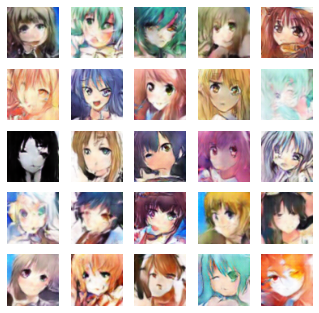

In [ ]:
dcgan = DCGAN()
dcgan.load_model()
dcgan.test()

Test WGAN

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (

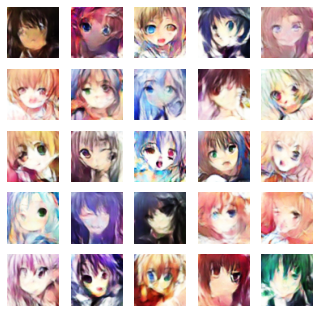

In [ ]:
wgan = WGAN()
wgan.load_model()
wgan.test()

Test WGAN-GP

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_run

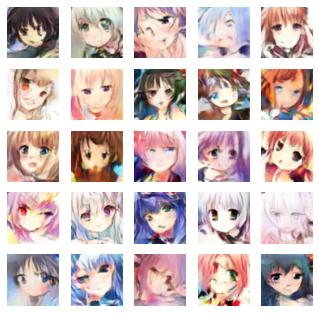

In [ ]:
wgan_gp = WGAN_GP()
wgan_gp.load_model()
wgan_gp.test()

Test with run_gan.sh and [gan-baseline](https://github.com/mldsta/gan-baseline).

In [6]:
!git clone https://github.com/mldsta/gan-baseline.git /content/gan-baseline

Cloning into '/content/gan-baseline'...
remote: Enumerating objects: 19, done.
remote: Total 19 (delta 0), reused 0 (delta 0), pack-reused 19
Unpacking objects: 100% (19/19), 2.70 KiB | 923.00 KiB/s, done.


In [7]:
!wget https://raw.githubusercontent.com/nagadomi/lbpcascade_animeface/master/lbpcascade_animeface.xml

--2023-06-09 08:49:49--  https://raw.githubusercontent.com/nagadomi/lbpcascade_animeface/master/lbpcascade_animeface.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 246945 (241K) [text/plain]
Saving to: ‘lbpcascade_animeface.xml’

lbpcascade_animefac 100%[===================>] 241.16K  --.-KB/s    in 0.01s   

2023-06-09 08:49:50 (22.2 MB/s) - ‘lbpcascade_animeface.xml’ saved [246945/246945]



In [8]:
!bash ./run_gan.sh 'gan_original.png'

2023-06-09 08:51:11.806322: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-09 08:51:12.664975: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Namespace(model='DCGAN', load_path='./saved_model/dcgan', tag_file=None, save_imgname='gan_original.png')
Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), paddi

In [9]:
!python /content/gan-baseline/baseline.py --input samples/gan_original.png

Detect 23 faces
Pass !


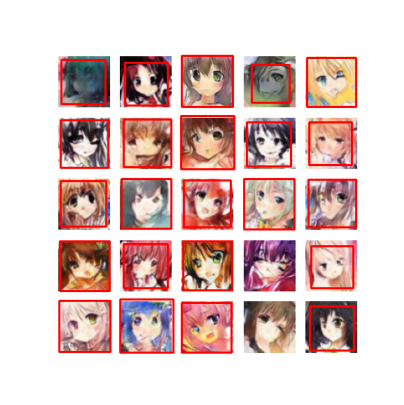

In [10]:
from PIL import Image
import matplotlib.pyplot as plt

test_result = Image.open('baseline_result.png')
plt.figure(figsize=(5, 5))
plt.imshow(test_result)
plt.axis('off')
plt.show()

# 3-2

In [ ]:
# only needed for CGAN
target_transform = torchvision.transforms.Lambda(
    lambda y: tag_dict[y]
    )

In [ ]:
hw3_dataset_extra = HW3Dataset(
    img_dir='/content/extra_data/images', 
    tag_file='/content/extra_data/tags.csv', 
    transform=transform,
    target_transform=target_transform,
    )

## Train the model

### CGAN

In [ ]:
from models.cgan import CGAN

In [ ]:
cgan = CGAN()

Discriminator(
  (label_embedding): Sequential(
    (0): Embedding(119, 100)
    (1): Linear(in_features=100, out_features=4096, bias=True)
  )
  (model): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)
Generator(
  (label_embedding): Sequential(
    (0): Embedding(119, 100)
    (1): Linear(in_features=100, out_features=100, bias=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(200, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d

In [ ]:
loader_train_extra = DataLoader(
    hw3_dataset_extra, 
    batch_size=64,
    shuffle=True, 
    drop_last=True, 
    num_workers=4,
    )

Epoch 1/200 Iter 0	D_Loss: 9.752, G_Loss: 0.03113


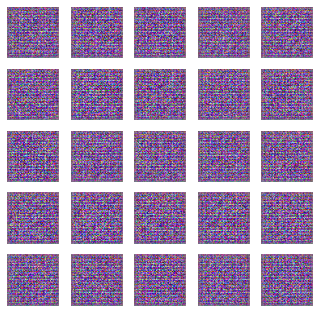

Save model to ./saved_model/cgan

Epoch 5/200 Iter 2500	D_Loss: -15.11, G_Loss: -25.36


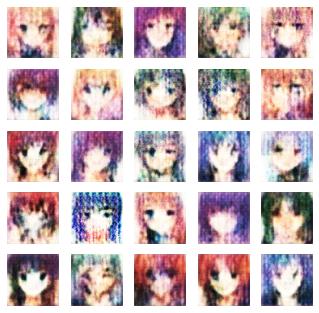

Save model to ./saved_model/cgan

Epoch 9/200 Iter 5000	D_Loss: -12.11, G_Loss: -57.87


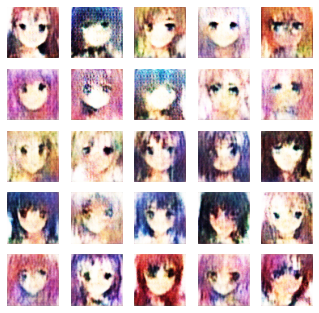

Save model to ./saved_model/cgan

Epoch 14/200 Iter 7500	D_Loss: -9.655, G_Loss: -9.776


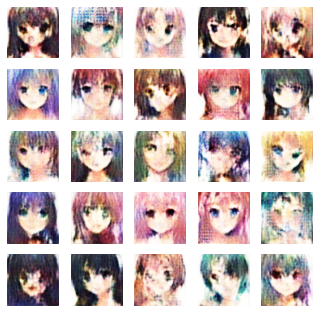

Save model to ./saved_model/cgan

Epoch 18/200 Iter 10000	D_Loss: -6.939, G_Loss: -7.466


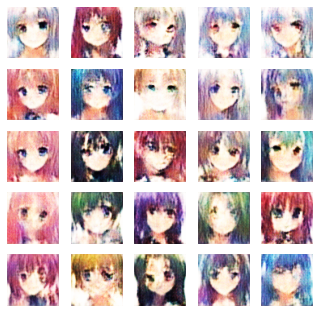

Save model to ./saved_model/cgan

Epoch 22/200 Iter 12500	D_Loss: -7.504, G_Loss: 0.55


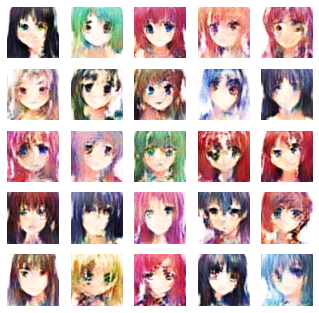

Save model to ./saved_model/cgan

Epoch 27/200 Iter 15000	D_Loss: -7.645, G_Loss: -2.564


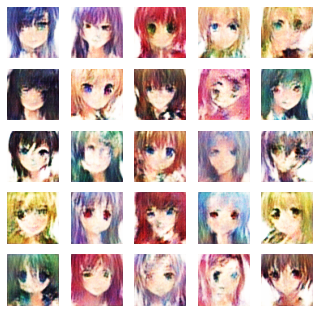

Save model to ./saved_model/cgan

Epoch 31/200 Iter 17500	D_Loss: -7.701, G_Loss: 1.176


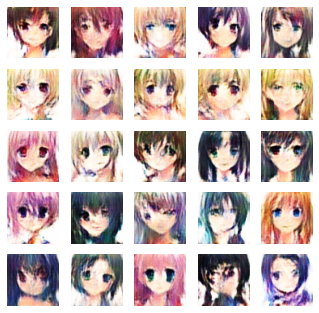

Save model to ./saved_model/cgan

Epoch 35/200 Iter 20000	D_Loss: -6.339, G_Loss: 1.33


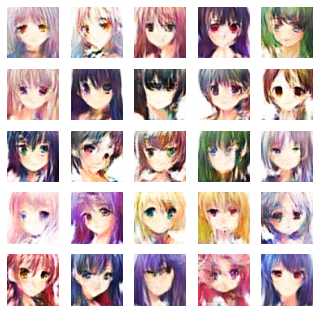

Save model to ./saved_model/cgan

Epoch 40/200 Iter 22500	D_Loss: -5.739, G_Loss: 11.84


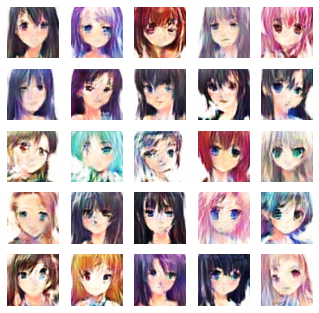

Save model to ./saved_model/cgan

Epoch 44/200 Iter 25000	D_Loss: -5.028, G_Loss: 6.956


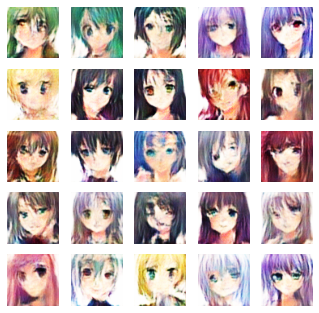

Save model to ./saved_model/cgan

Epoch 48/200 Iter 27500	D_Loss: -5.752, G_Loss: 3.53


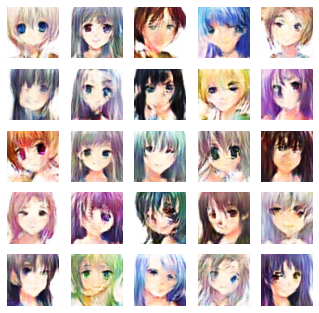

Save model to ./saved_model/cgan

Epoch 53/200 Iter 30000	D_Loss: -5.387, G_Loss: 5.184


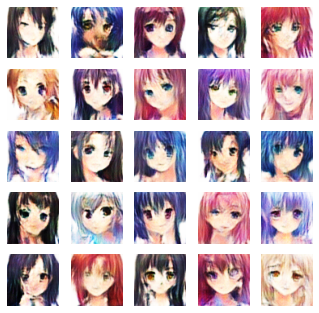

Save model to ./saved_model/cgan

Epoch 57/200 Iter 32500	D_Loss: -5.693, G_Loss: -0.1988


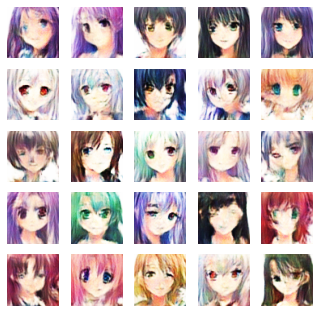

Save model to ./saved_model/cgan

Epoch 61/200 Iter 35000	D_Loss: -5.516, G_Loss: 4.591


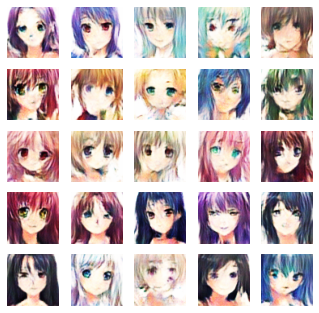

Save model to ./saved_model/cgan

Epoch 66/200 Iter 37500	D_Loss: -4.83, G_Loss: 10.52


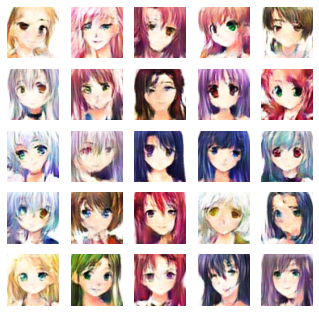

Save model to ./saved_model/cgan

Epoch 70/200 Iter 40000	D_Loss: -5.005, G_Loss: 2.97


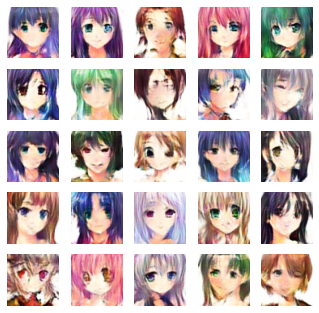

Save model to ./saved_model/cgan

Epoch 75/200 Iter 42500	D_Loss: -5.398, G_Loss: 0.335


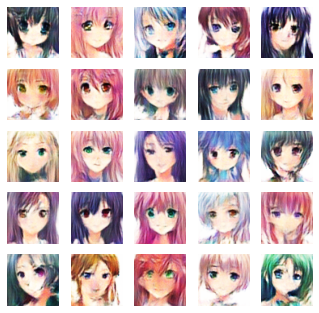

Save model to ./saved_model/cgan

Epoch 79/200 Iter 45000	D_Loss: -5.198, G_Loss: 4.291


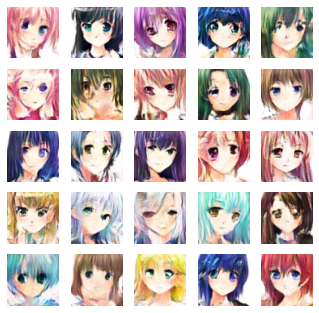

Save model to ./saved_model/cgan

Epoch 83/200 Iter 47500	D_Loss: -5.636, G_Loss: -1.11


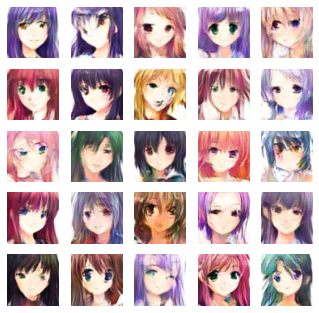

Save model to ./saved_model/cgan

Epoch 88/200 Iter 50000	D_Loss: -5.843, G_Loss: 6.793


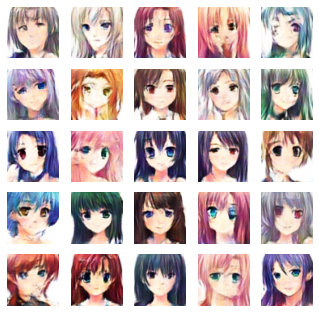

Save model to ./saved_model/cgan

Epoch 92/200 Iter 52500	D_Loss: -4.475, G_Loss: 4.205


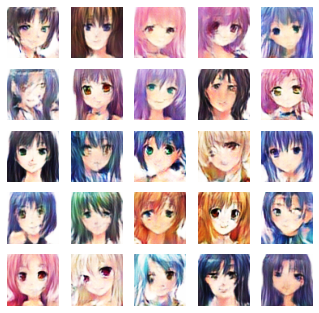

Save model to ./saved_model/cgan

Epoch 96/200 Iter 55000	D_Loss: -5.245, G_Loss: -2.623


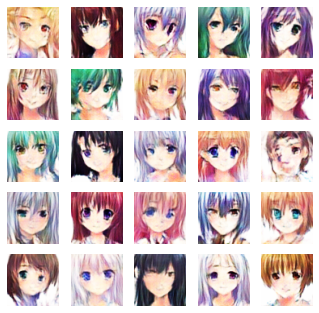

Save model to ./saved_model/cgan

Epoch 101/200 Iter 57500	D_Loss: -5.047, G_Loss: 3.259


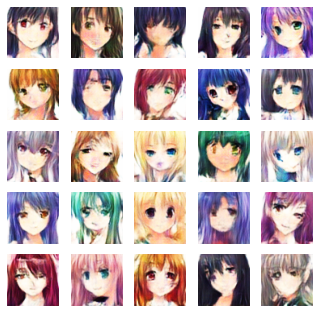

Save model to ./saved_model/cgan

Epoch 105/200 Iter 60000	D_Loss: -5.81, G_Loss: -2.583


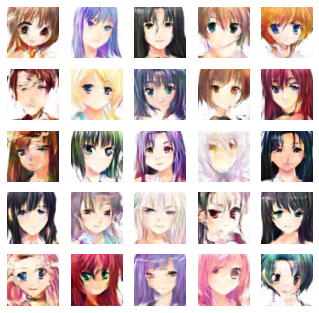

Save model to ./saved_model/cgan

Epoch 109/200 Iter 62500	D_Loss: -4.82, G_Loss: 0.1342


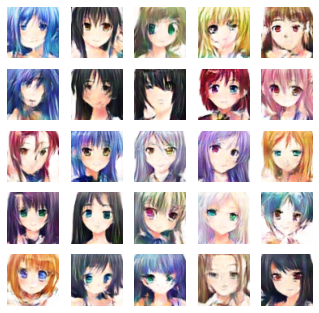

Save model to ./saved_model/cgan

Epoch 114/200 Iter 65000	D_Loss: -3.586, G_Loss: -0.8485


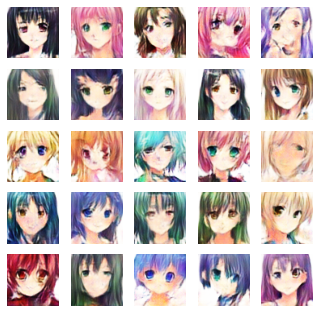

Save model to ./saved_model/cgan

Epoch 118/200 Iter 67500	D_Loss: -5.77, G_Loss: 7.31


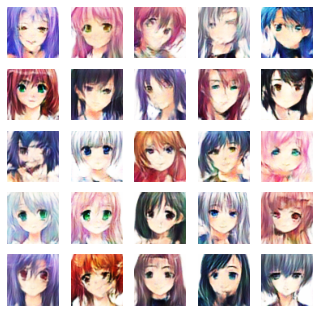

Save model to ./saved_model/cgan

Epoch 122/200 Iter 70000	D_Loss: -5.476, G_Loss: -2.583


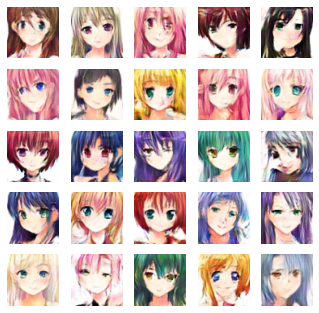

Save model to ./saved_model/cgan

Epoch 127/200 Iter 72500	D_Loss: -4.856, G_Loss: -1.619


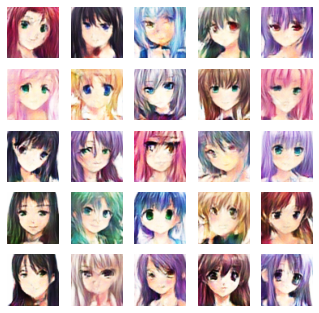

Save model to ./saved_model/cgan

Epoch 131/200 Iter 75000	D_Loss: -4.996, G_Loss: -2.797


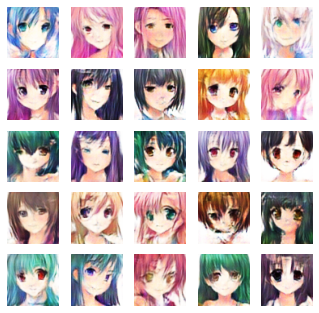

Save model to ./saved_model/cgan

Epoch 136/200 Iter 77500	D_Loss: -4.619, G_Loss: -1.297


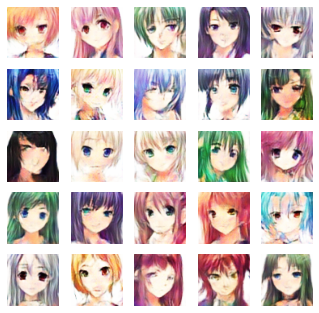

Save model to ./saved_model/cgan

Epoch 140/200 Iter 80000	D_Loss: -4.903, G_Loss: 5.874


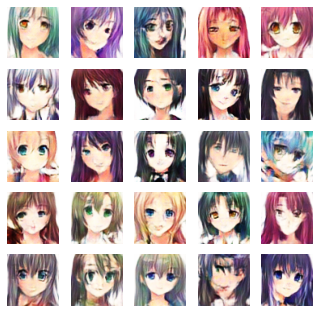

Save model to ./saved_model/cgan

Epoch 144/200 Iter 82500	D_Loss: -5.06, G_Loss: 8.571


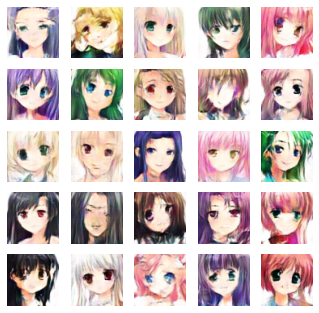

Save model to ./saved_model/cgan

Epoch 149/200 Iter 85000	D_Loss: -4.438, G_Loss: 11.09


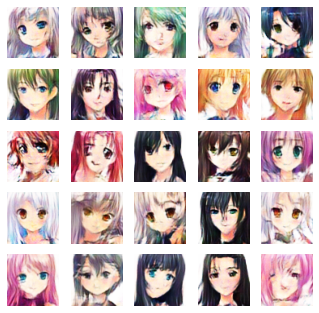

Save model to ./saved_model/cgan

Epoch 153/200 Iter 87500	D_Loss: -4.796, G_Loss: 10.9


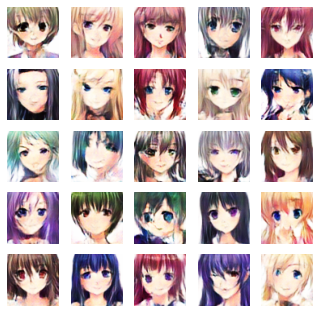

Save model to ./saved_model/cgan

Epoch 157/200 Iter 90000	D_Loss: -4.235, G_Loss: 1.669


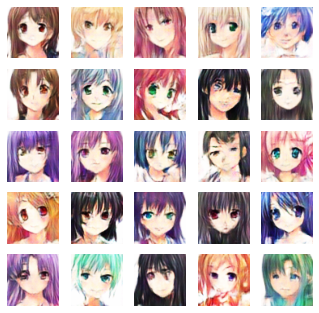

Save model to ./saved_model/cgan

Epoch 162/200 Iter 92500	D_Loss: -4.166, G_Loss: 11.95


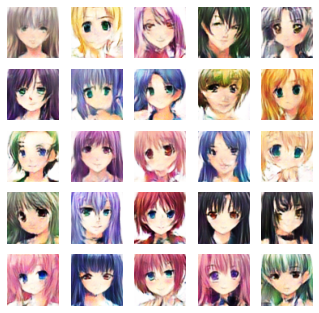

Save model to ./saved_model/cgan

Epoch 166/200 Iter 95000	D_Loss: -4.74, G_Loss: 4.789


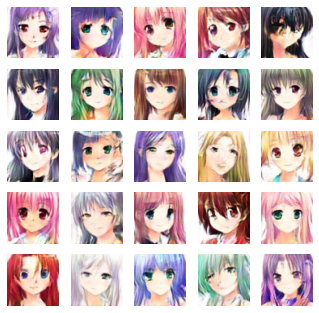

Save model to ./saved_model/cgan

Epoch 170/200 Iter 97500	D_Loss: -4.293, G_Loss: 1.898


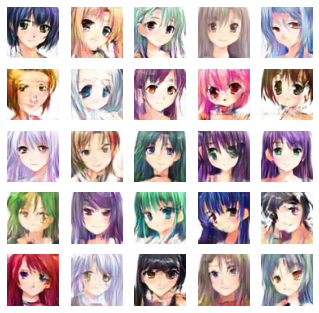

Save model to ./saved_model/cgan

Epoch 175/200 Iter 100000	D_Loss: -4.327, G_Loss: 0.9203


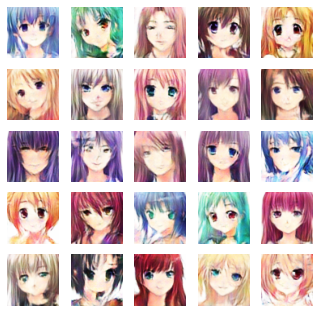

Save model to ./saved_model/cgan

Epoch 179/200 Iter 102500	D_Loss: -4.685, G_Loss: -3.224


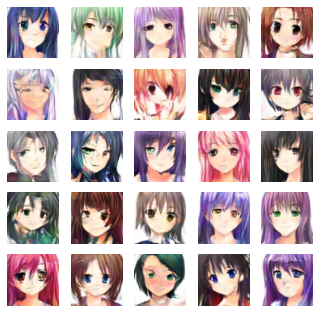

Save model to ./saved_model/cgan

Epoch 183/200 Iter 105000	D_Loss: -3.838, G_Loss: 4.162


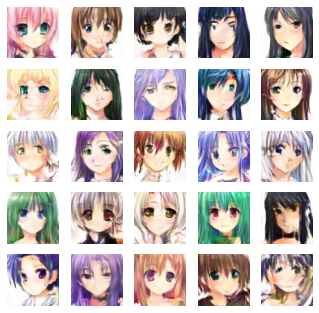

Save model to ./saved_model/cgan

Epoch 188/200 Iter 107500	D_Loss: -4.272, G_Loss: -0.1361


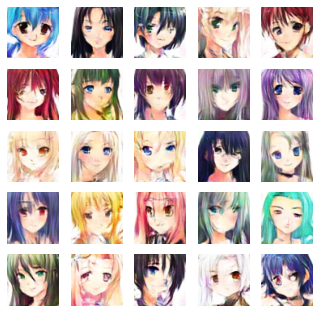

Save model to ./saved_model/cgan

Epoch 192/200 Iter 110000	D_Loss: -4.319, G_Loss: 6.454


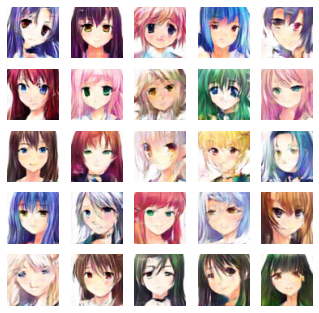

Save model to ./saved_model/cgan

Epoch 196/200 Iter 112500	D_Loss: -4.226, G_Loss: 3.253


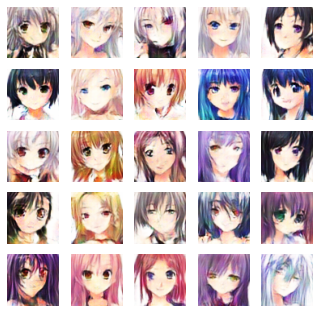

Save model to ./saved_model/cgan

Save model to ./saved_model/cgan


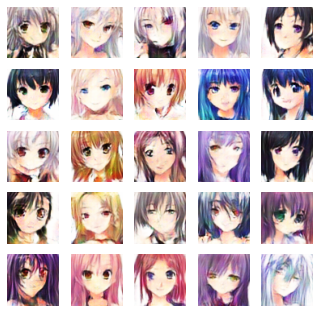

In [ ]:
# executing for about 3.7 hr
cgan.train(data_loader=loader_train_extra, show_every=2500, num_epochs=200)

## Testing

In [ ]:
from models.cgan import CGAN

In [ ]:
with open('/content/testing_tags.txt') as f:
  tags = f.readlines()

tags = [t.split(',')[1].split('\n')[0] for t in tags]
tags

['blue hair blue eyes',
 'blue hair blue eyes',
 'blue hair blue eyes',
 'blue hair blue eyes',
 'blue hair blue eyes',
 'blue hair green eyes',
 'blue hair green eyes',
 'blue hair green eyes',
 'blue hair green eyes',
 'blue hair green eyes',
 'blue hair red eyes',
 'blue hair red eyes',
 'blue hair red eyes',
 'blue hair red eyes',
 'blue hair red eyes',
 'green hair blue eyes',
 'green hair blue eyes',
 'green hair blue eyes',
 'green hair blue eyes',
 'green hair blue eyes',
 'green hair red eyes',
 'green hair red eyes',
 'green hair red eyes',
 'green hair red eyes',
 'green hair red eyes']

Discriminator(
  (label_embedding): Sequential(
    (0): Embedding(119, 100)
    (1): Linear(in_features=100, out_features=4096, bias=True)
  )
  (model): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)
Generator(
  (label_embedding): Sequential(
    (0): Embedding(119, 100)
    (1): Linear(in_features=100, out_features=100, bias=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(200, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d

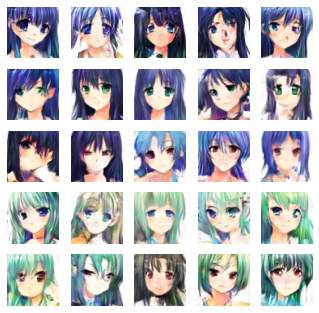

In [ ]:
cgan = CGAN()
cgan.load_model()
cgan.test(tags)

Test with run_cgan.sh and [gan-baseline](https://github.com/mldsta/gan-baseline).

In [11]:
!bash ./run_cgan.sh '/content/testing_tags.txt' 'cgan_original.png'

2023-06-09 08:53:53.540912: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-09 08:53:54.401522: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Namespace(model='CGAN', load_path='./saved_model/cgan', tag_file='/content/testing_tags.txt', save_imgname='cgan_original.png')
Discriminator(
  (label_embedding): Sequential(
    (0): Embedding(119, 100)
    (1): Linear(in_features=100, out_features=4096, bias=True)
  )
  (model): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (

In [12]:
!python /content/gan-baseline/baseline.py --input samples/cgan_original.png

Detect 25 faces
Pass !


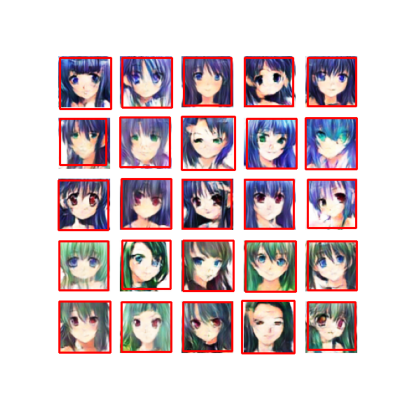

In [13]:
from PIL import Image
import matplotlib.pyplot as plt

test_result = Image.open('baseline_result.png')
plt.figure(figsize=(5, 5))
plt.imshow(test_result)
plt.axis('off')
plt.show()